In [3]:
#%pip install numpy matplotlib tifffile lxml


   ---------------------------------------- 224.5/224.5 kB 4.6 MB/s eta 0:00:00
   ---------------------------------------- 3.9/3.9 MB 5.4 MB/s eta 0:00:00


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tifffile import TiffFile, imread, imwrite
import json
from pprint import pprint
import xml.dom.minidom
import sciebo

Run the below cells to download datasets for the first two sections of the notebook

This might take a while. In the meantime, feel free to read a bit about the datasets. If the download is fast and you didn't get a chance to read about it, it's okay as we are learning about the file structure and will not be doing any analysis.

1. `data_endoscope.tif` 1-photon microendoscopic data from mouse dorsal striatum [Reference](https://elifesciences.org/articles/28728#s3).
2. `Sue_2x_3000_40_-46.tif` (taken from CaImAn) dataset by Sue Koay and David Tank. 2-photon data from supragranular parietal cortex mouse during a virtual reality task.

In [5]:
# sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/aLuGqYoZRFgwhzF', 'data/data_endoscope.tif')
# sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/RR7qj7tklW1rX25', 'data/Sue_2x_3000_40_-46.tif')

## Reading TIFF File 

TIFF, which stands for Tagged Image File Format, is a flexible and adaptable file format for storing images and data within a single file. It can be used to store multiple frames as `pages`.

| Method | Description |
| ------ | ----------- |
| `imread('path/to/file')` | Reads TIFF files as NumPy arrays. |
| `TiffFile('path/to/file')` | Provides more detailed control over reading TIFF files, including accessing metadata and handling complex file structures. |
| `%%timeit` | Measures the execution time of code blocks, useful for performance optimization. |

**Example** Read `data_endoscope.tif`. How many frames does it have?

In [6]:
frames = imread('data/data_endoscope.tif')
frames.shape

(1000, 128, 128)

Read `Sue_2x_3000_40_-46.tif`. How many frames does this data have?

In [7]:
frames = imread('data/Sue_2x_3000_40_-46.tif')
frames.shape

(3000, 170, 170)

Read `Sue_2x_3000_40_-46.tif`. How long does it take?

Hint: Put `%%timeit` in the beginning of the cell

In [8]:
%%timeit
frames = imread('data/Sue_2x_3000_40_-46.tif')

178 ms ± 26.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Read `Sue_2x_3000_40_-46.tif`. How long does it take to access the last frame?

Hint: Put `%%timeit` in the beginning of the cell

In [18]:
frames = imread('data/Sue_2x_3000_40_-46.tif', key=range(5))

**Example** Let's see the plots. Plot the first frame

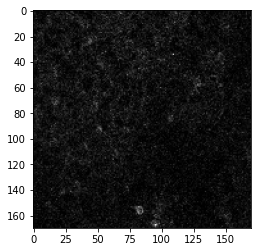

In [12]:
plt.imshow(frames[0,:,:], cmap='gray')

Plot the last frame

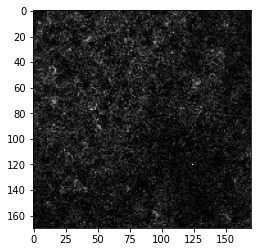

In [13]:
plt.imshow(frames[-1,:,:], cmap='gray')

**Example** Read only the first 3 frames from `Sue_2x_3000_40_-46.tif`

In [ ]:
frames = imread('data/Sue_2x_3000_40_-46.tif', key=(0, 1, 2))
frames.shape

Read only 1, 3, 5, 7, 9th frame from `Sue_2x_3000_40_-46.tif`

In [19]:
frames = imread('data/Sue_2x_3000_40_-46.tif', key=(1,3,5,7,9))
frames.shape

(5, 170, 170)

Read only first 100 frames from `Sue_2x_3000_40_-46.tif`

Hint: use range(0, 100)

In [20]:
frames = imread('data/Sue_2x_3000_40_-46.tif', key=range(100))
frames.shape

(100, 170, 170)

**Example** Read `data_endoscope.tif` with `TiffFile`?

In [21]:
f = TiffFile('data/data_endoscope.tif')
frames = np.array([page.asarray() for page in f.pages])

Read `Sue_2x_3000_40_-46.tif` with TiffFile

In [22]:
f = TiffFile('data/Sue_2x_3000_40_-46.tif')
frames2 = np.array([page.asarray() for page in f.pages])

How long does it take to read `Sue_2x_3000_40_-46.tif` with TiffFile?

In [23]:
%%timeit
f = TiffFile('data/Sue_2x_3000_40_-46.tif')
frames2 = np.array([page.asarray() for page in f.pages])

847 ms ± 77.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


How long does it take to access only the last frame with TiffFile?

In [24]:
%%timeit
f = TiffFile('data/Sue_2x_3000_40_-46.tif')
tmp=np.asarray(f.pages[-1])

6.03 ms ± 138 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


## Metadata handling and TIFF file writing 

This section focuses on metadata handling and writing TIFF files with custom metadata, for managing and documenting image datasets in research. The methods demonstrated include extracting metadata from TIFF files, writing TIFF files with specified photometric interpretations, and embedding custom JSON-formatted metadata into TIFF files. 

| Method | Description |
| ------ | ----------- |
| `TiffFile('path/to/file')` | Opens a TIFF file for reading, providing access to image data and metadata. |
| `.pages[N].tags` | Accesses the tags (metadata) of the Nth page in the TIFF file. |
| `imwrite()` | Writes image data to a TIFF file, with options for specifying photometric interpretation and embedding custom metadata. |
| `json.dumps()` | Converts a Python dictionary into a JSON-formatted string suitable for embedding as metadata. |

**Example** Read and print basic information about `data_endoscope.tif`

In [4]:
f = TiffFile('data/data_endoscope.tif')
print(f)

TiffFile 'data_endoscope.tif'  31.68 MiB  1000 Pages  uniform


Read and print basic information about Sue_2x_3000_40_-46.tif

In [5]:
f = TiffFile('data/Sue_2x_3000_40_-46.tif')
print(f)

TiffFile 'Sue_2x_3000_40_-46.tif'  331.13 MiB  3000 Pages  shaped|uniform


**Example** Print detailed information of first page of `data_endoscope.tif`

In [6]:
f = TiffFile('data/data_endoscope.tif')
print(f.pages[0].tags)

TiffTag 256 ImageWidth @33024 SHORT @33032 = 128
TiffTag 257 ImageLength @33036 SHORT @33044 = 128
TiffTag 258 BitsPerSample @33048 SHORT @33056 = 16
TiffTag 259 Compression @33060 SHORT @33068 = PACKBITS
TiffTag 262 PhotometricInterpretation @33072 SHORT @33080 = MINISBLACK
TiffTag 273 StripOffsets @33084 LONG[2] @33220 = (8, 16509)
TiffTag 274 Orientation @33096 SHORT @33104 = TOPLEFT
TiffTag 277 SamplesPerPixel @33108 SHORT @33116 = 1
TiffTag 278 RowsPerStrip @33120 SHORT @33128 = 64
TiffTag 279 StripByteCounts @33132 LONG[2] @33212 = (16501, 16512)
TiffTag 282 XResolution @33144 RATIONAL @33196 = (72, 1)
TiffTag 283 YResolution @33156 RATIONAL @33204 = (72, 1)
TiffTag 284 PlanarConfiguration @33168 SHORT @33176 = CONTIG
TiffTag 296 ResolutionUnit @33180 SHORT @33188 = INCH


Print detailed information of 500th page of `data_endoscope.tif`. How is it same or different from that of the first page?

In [7]:
print(f.pages[500].tags)

TiffTag 256 ImageWidth @16643176 SHORT @16643184 = 128
TiffTag 257 ImageLength @16643188 SHORT @16643196 = 128
TiffTag 258 BitsPerSample @16643200 SHORT @16643208 = 16
TiffTag 259 Compression @16643212 SHORT @16643220 = PACKBITS
TiffTag 262 PhotometricInterpretation @16643224 SHORT @16643232 = MINISBLACK
TiffTag 273 StripOffsets @16643236 LONG[2] @16643372 = (16610156, 16626663)
TiffTag 274 Orientation @16643248 SHORT @16643256 = TOPLEFT
TiffTag 277 SamplesPerPixel @16643260 SHORT @16643268 = 1
TiffTag 278 RowsPerStrip @16643272 SHORT @16643280 = 64
TiffTag 279 StripByteCounts @16643284 LONG[2] @16643364 = (16507, 16510)
TiffTag 282 XResolution @16643296 RATIONAL @16643348 = (72, 1)
TiffTag 283 YResolution @16643308 RATIONAL @16643356 = (72, 1)
TiffTag 284 PlanarConfiguration @16643320 SHORT @16643328 = CONTIG
TiffTag 296 ResolutionUnit @16643332 SHORT @16643340 = INCH


Print detailed information of 1000th page of `data_endoscope.tif`. How is it same or different from that of the other two pages?

In [9]:
print(f.pages[999].tags)

TiffTag 256 ImageWidth @33220494 SHORT @33220502 = 128
TiffTag 257 ImageLength @33220506 SHORT @33220514 = 128
TiffTag 258 BitsPerSample @33220518 SHORT @33220526 = 16
TiffTag 259 Compression @33220530 SHORT @33220538 = PACKBITS
TiffTag 262 PhotometricInterpretation @33220542 SHORT @33220550 = MINISBLACK
TiffTag 273 StripOffsets @33220554 LONG[2] @33220690 = (33187470, 33203979)
TiffTag 274 Orientation @33220566 SHORT @33220574 = TOPLEFT
TiffTag 277 SamplesPerPixel @33220578 SHORT @33220586 = 1
TiffTag 278 RowsPerStrip @33220590 SHORT @33220598 = 64
TiffTag 279 StripByteCounts @33220602 LONG[2] @33220682 = (16509, 16512)
TiffTag 282 XResolution @33220614 RATIONAL @33220666 = (72, 1)
TiffTag 283 YResolution @33220626 RATIONAL @33220674 = (72, 1)
TiffTag 284 PlanarConfiguration @33220638 SHORT @33220646 = CONTIG
TiffTag 296 ResolutionUnit @33220650 SHORT @33220658 = INCH


**Example** Extract the value of 'ImageWidth' on 1000th page of `data_endoscope`

In [10]:
f = TiffFile('data/data_endoscope.tif')
print(f.pages[999].tags['ImageWidth'].value)

128


Extract the value of 'PhotometricInterpretation' on 1000th page of `data_endoscope`

In [11]:
print(f.pages[999].tags['PhotometricInterpretation'].value)

PHOTOMETRIC.MINISBLACK


Extract the value of 'ResolutionUnit' on 1000th page of `data_endoscope`

In [12]:
print(f.pages[999].tags['ResolutionUnit'].value)

RESUNIT.INCH


Let's practice writing TIFF files. Run the below cell to make three 100x100 frames/pages of random values

In [13]:
frame1 = np.random.rand(100, 100)  # Frame 1
frame2 = np.random.rand(100, 100)  # Frame 2
frame3 = np.random.rand(100, 100)  # Frame 3

**Example** Write frame1, frame2, frame3 as three pages of output_file.tiff with `minisblack` photometric interpretation. Read the tags. What is 'minisblack' photometric interpretation?

In [14]:
tiff_path = 'output_file.tiff'
imwrite(tiff_path, [frame1, frame2, frame3], photometric='minisblack')

f = TiffFile('output_file.tiff')
print(f.pages[-1].tags)

TiffTag 256 ImageWidth @240452 LONG @240460 = 100
TiffTag 257 ImageLength @240464 LONG @240472 = 100
TiffTag 258 BitsPerSample @240476 SHORT @240484 = 64
TiffTag 259 Compression @240488 SHORT @240496 = NONE
TiffTag 262 PhotometricInterpretation @240500 SHORT @240508 = MINISBLACK
TiffTag 273 StripOffsets @240512 LONG @240520 = (160272,)
TiffTag 277 SamplesPerPixel @240524 SHORT @240532 = 1
TiffTag 278 RowsPerStrip @240536 LONG @240544 = 100
TiffTag 279 StripByteCounts @240548 LONG @240556 = (80000,)
TiffTag 282 XResolution @240560 RATIONAL @240434 = (1, 1)
TiffTag 283 YResolution @240572 RATIONAL @240442 = (1, 1)
TiffTag 296 ResolutionUnit @240584 SHORT @240592 = NONE
TiffTag 339 SampleFormat @240596 SHORT @240604 = IEEEFP


Write frame1, frame2, frame3 as three pages of output_file.tiff with `rgb` photometric interpretation. Read the tags. What is 'rgb' photometric interpretation?

In [15]:
tiff_path = 'output_file.tiff'
imwrite(tiff_path, [frame1, frame2, frame3], photometric='rgb')

f = TiffFile('output_file.tiff')
print(f.pages[-1].tags['PhotometricInterpretation'].value)

PHOTOMETRIC.RGB


**Example** Write `Experiment` as `Calcium Imaging` into metadata

In [16]:
metadata = {
    'Experiment': 'Calcium Imaging',
}
metadata_json = json.dumps(metadata)
tiff_path = 'output_file.tiff'
imwrite(tiff_path, [frame1, frame2, frame3], description=metadata_json)

f = TiffFile('output_file.tiff')
print(f.pages[0].tags['ImageDescription'].value)

{"Experiment": "Calcium Imaging"}


Write `Experiment` as `Calcium Imaging` and `Date` to today's date into metadata

In [17]:
metadata = {
    'Experiment': 'Calcium Imaging',
    'Date': '2024-02-28'
}
metadata_json = json.dumps(metadata)
tiff_path = 'output_file.tiff'
imwrite(tiff_path, [frame1, frame2, frame3], description=metadata_json)

f = TiffFile('output_file.tiff')
print(f.pages[0].tags['ImageDescription'].value)

{"Experiment": "Calcium Imaging", "Date": "2024-02-28"}


Write `Experiment` as `Calcium Imaging`, `Date` to today's date, and `Researcher` to your name into metadata

## OME data model and structure

This section introduces the OME-TIFF format, a specialized version of TIFF for microscopy images, which includes extensive metadata in the OME-XML standard format. This metadata can describe the image dimensions, acquisition parameters, and much (much) more, making OME-TIFF an important format for scientific imaging.

| Method | Description |
| ------ | ----------- |
| `TiffFile()` | Opens an OME-TIFF file for reading both image data and metadata. |
| `ome_metadata` | Accesses the embedded OME-XML metadata from an OME-TIFF file. |
| `xml.dom.minidom.parseString()` | Parses the OME-XML string and pretty-prints it, enhancing readability. |
| `plt.imshow()` | Visualizes individual image frames, useful for inspecting the data. |
| `FuncAnimation` | Creates an animation from a sequence of frames, ideal for visualizing changes over time or space in the dataset. |

In [3]:
sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/IQzFzXXTosmY2MY', 'data/output.ome.tiff')
sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/QNOpF1JvRPM0qWm', 'data/multifile-Z1.ome.tiff')
sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/8sKghg9SGBttZW5', 'data/multifile-Z2.ome.tiff')
sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/6xtxbSysECFPrHy', 'data/multifile-Z3.ome.tiff')
sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/sxwwSUGmtQtSZ0l', 'data/multifile-Z4.ome.tiff')
sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/NRgPnsz3Pnhkv3r', 'data/multifile-Z5.ome.tiff')


**Example** Read and print OME metadata from output_file.tiff. Is there any?

In [4]:
f = TiffFile('output_file.tiff')
ome_metadata = f.ome_metadata
print(ome_metadata)

None


Read and print ome metadata of `output.ome.tiff`. Is it readable?

In [6]:
f = TiffFile('data/output.ome.tiff')
ome_metadata = f.ome_metadata
print(ome_metadata)

<?xml version="1.0" encoding="UTF-8"?><OME xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd" UUID="urn:uuid:dc49c107-d407-11ee-935e-9009df8e0d1d"  Creator="tifffile.py 2023.8.12"><Image ID="Image:0" Name="Image0"><Description>{'Experiment': 'Calcium Imaging'}</Description><Pixels ID="Pixels:0" DimensionOrder="XYCZT" Type="double" SizeX="100" SizeY="100" SizeC="3" SizeZ="1" SizeT="1"><Channel ID="Channel:0:0" SamplesPerPixel="1"><LightPath/></Channel><Channel ID="Channel:0:1" SamplesPerPixel="1"><LightPath/></Channel><Channel ID="Channel:0:2" SamplesPerPixel="1"><LightPath/></Channel><TiffData IFD="0" PlaneCount="3"/></Pixels></Image></OME>


Let's make it more readable. Instead of `print` use `pprint` which means `pretty print`

In [7]:
f = TiffFile('data/output.ome.tiff')
ome_metadata = f.ome_metadata
pprint(ome_metadata)

('<?xml version="1.0" encoding="UTF-8"?><OME '
 'xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" '
 'xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" '
 'xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 '
 'http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd" '
 'UUID="urn:uuid:dc49c107-d407-11ee-935e-9009df8e0d1d"  Creator="tifffile.py '
 '2023.8.12"><Image ID="Image:0" Name="Image0"><Description>{\'Experiment\': '
 '\'Calcium Imaging\'}</Description><Pixels ID="Pixels:0" '
 'DimensionOrder="XYCZT" Type="double" SizeX="100" SizeY="100" SizeC="3" '
 'SizeZ="1" SizeT="1"><Channel ID="Channel:0:0" '
 'SamplesPerPixel="1"><LightPath/></Channel><Channel ID="Channel:0:1" '
 'SamplesPerPixel="1"><LightPath/></Channel><Channel ID="Channel:0:2" '
 'SamplesPerPixel="1"><LightPath/></Channel><TiffData IFD="0" '
 'PlaneCount="3"/></Pixels></Image></OME>')


Better. The format of the output is XML. XML, which stands for eXtensible Markup Language, is a markup language that defines a set of rules for encoding documents in a format that is both human-readable and machine-readable. 

**Example** Read ome metadata of output.ome.tiff and use inbuilt library `xml` to parse the string format to pretty xml. 

In [8]:
f = TiffFile('data/output.ome.tiff')
ome_metadata = f.ome_metadata
dom = xml.dom.minidom.parseString(ome_metadata) 
pprint(dom.toprettyxml())

('<?xml version="1.0" ?>\n'
 '<OME xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" '
 'xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" '
 'xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 '
 'http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd" '
 'UUID="urn:uuid:dc49c107-d407-11ee-935e-9009df8e0d1d" Creator="tifffile.py '
 '2023.8.12">\n'
 '\t<Image ID="Image:0" Name="Image0">\n'
 "\t\t<Description>{'Experiment': 'Calcium Imaging'}</Description>\n"
 '\t\t<Pixels ID="Pixels:0" DimensionOrder="XYCZT" Type="double" SizeX="100" '
 'SizeY="100" SizeC="3" SizeZ="1" SizeT="1">\n'
 '\t\t\t<Channel ID="Channel:0:0" SamplesPerPixel="1">\n'
 '\t\t\t\t<LightPath/>\n'
 '\t\t\t</Channel>\n'
 '\t\t\t<Channel ID="Channel:0:1" SamplesPerPixel="1">\n'
 '\t\t\t\t<LightPath/>\n'
 '\t\t\t</Channel>\n'
 '\t\t\t<Channel ID="Channel:0:2" SamplesPerPixel="1">\n'
 '\t\t\t\t<LightPath/>\n'
 '\t\t\t</Channel>\n'
 '\t\t\t<TiffData IFD="0" PlaneCount="3"/>\n'
 '\t\t</Pixe

Read ome metadata of multifile-Z1.ome.tiff and use inbuilt library `xml` to parse the string format to pretty xml 

In [9]:
f = TiffFile('data/multifile-Z1.ome.tiff')
ome_metadata = f.ome_metadata
dom = xml.dom.minidom.parseString(ome_metadata) 
pprint(dom.toprettyxml())

('<?xml version="1.0" ?>\n'
 '<!-- Warning: this comment is an OME-XML metadata block, which contains '
 'crucial dimensional parameters and other important metadata. Please edit '
 'cautiously (if at all), and back up the original data before doing so. For '
 'more information, see the OME-TIFF web site: '
 'http://www.openmicroscopy.org/site/support/ome-model/ome-tiff/. -->\n'
 '<OME xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" '
 'xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" Creator="OME '
 'Bio-Formats 5.2.0-m4" UUID="urn:uuid:d25bfea2-2708-4a4f-bcd9-8ab1ac478041" '
 'xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 '
 'http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd">\n'
 '\t<Image ID="Image:0" Name="multifile">\n'
 '\t\t<AcquisitionDate>2010-03-02T15:08:59</AcquisitionDate>\n'
 '\t\t<Pixels BigEndian="false" DimensionOrder="XYCTZ" ID="Pixels:0:0" '
 'Type="uint8" SizeC="1" SizeT="1" SizeX="18" SizeY="24" SizeZ="5">\n'
 '\t\t\t<

Let's download another ome file for a fun visualization exercise. Run the below cell.

This might take a while, so feel free to read more about the dataset: https://downloads.openmicroscopy.org/images/OME-TIFF/2016-06/MitoCheck/

In [10]:
sciebo.download_from_sciebo('https://uni-bonn.sciebo.de/s/jui4quIkGdkENPb', 'data/00001_01.ome.tiff')

Let's use `00001_01.ome.tiff` for the rest of the exercises. Read its metadata and pretty print in pretty xml.

Looking through its data, what are the X, Y, and temporal dimensions?

In [11]:
f = TiffFile('data/00001_01.ome.tiff')
ome_metadata = f.ome_metadata
dom = xml.dom.minidom.parseString(ome_metadata) 
pprint(dom.toprettyxml())

('<?xml version="1.0" ?>\n'
 '<!-- Warning: this comment is an OME-XML metadata block, which contains '
 'crucial dimensional parameters and other important metadata. Please edit '
 'cautiously (if at all), and back up the original data before doing so. For '
 'more information, see the OME-TIFF web site: '
 'http://www.openmicroscopy.org/site/support/ome-model/ome-tiff/. -->\n'
 '<OME xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" '
 'xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" Creator="OME '
 'Bio-Formats 5.2.4" UUID="urn:uuid:2c7a951e-2fdb-4e58-8620-c8a782bef30a" '
 'xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 '
 'http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd">\n'
 '\t<Plate ID="Plate:0" '
 'Name="LT0001_02--ex2005_11_16--sp2005_02_17--tt17--c3">\n'
 '\t\t<Well Column="0" ExternalIdentifier="00001" ID="Well:0" Row="0">\n'
 '\t\t\t<WellSample ID="WellSample:0" Index="1">\n'
 '\t\t\t\t<ImageRef ID="Image:0"/>\n'
 '\t\t\t</Well

Confirm the dimensions by checking shape of the image data

In [15]:
f = TiffFile('data/00001_01.ome.tiff')
image_data = f.asarray()
image_data.shape

(93, 1024, 1344)

**Example** It's been a while since we visualized something! Let's see how the first frame looks like? What kind of data is this?

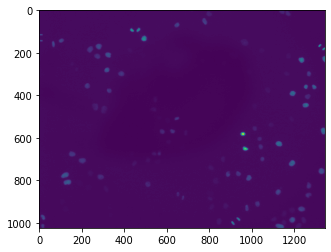

In [16]:
f = TiffFile('data/00001_01.ome.tiff')
image_data = f.asarray()
plt.imshow(image_data[0]);

Let's see how the second frame looks like.

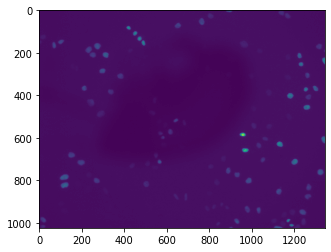

In [17]:
plt.imshow(image_data[1]);

Let's see how the last frame looks like.

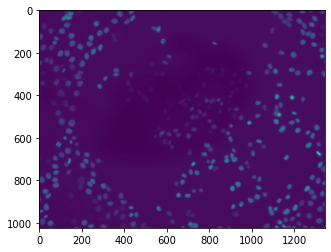

In [18]:
plt.imshow(image_data[-1]);

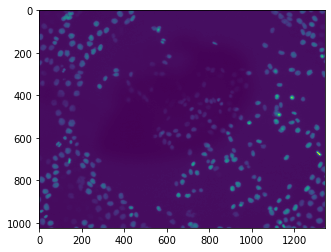

In [19]:
from matplotlib.animation import FuncAnimation

frames = image_data.copy()

fig, ax = plt.subplots()
frame = frames[0]  
im = ax.imshow(frame, animated=True)

def update(frame):
    im.set_array(frame)
    return [im]

ani = FuncAnimation(fig, update, frames=frames, blit=True, interval=50);

from IPython.display import HTML
HTML(ani.to_jshtml())


## Writing OME Data and metadata

In [20]:
frame1 = np.random.rand(100, 100)  # Frame 1
frame2 = np.random.rand(100, 100)  # Frame 2
frame3 = np.random.rand(100, 100)  # Frame 3

Write extra metadata 'Experiment' as 'Calcium Imaging'

In [21]:
metadata = {
    'Experiment': 'Calcium Imaging',
}
tiff_path = 'output.ome.tiff'
imwrite(tiff_path, [frame1, frame2, frame3], metadata={'Description': str(metadata)})

f = TiffFile('output.ome.tiff')
ome_metadata = f.ome_metadata
pprint(ome_metadata)

('<?xml version="1.0" encoding="UTF-8"?><OME '
 'xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" '
 'xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" '
 'xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 '
 'http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd" '
 'UUID="urn:uuid:09ec65a4-d688-11ee-8e35-acd05dbb10df"  Creator="tifffile.py '
 '2024.2.12"><Image ID="Image:0" Name="Image0"><Description>{\'Experiment\': '
 '\'Calcium Imaging\'}</Description><Pixels ID="Pixels:0" '
 'DimensionOrder="XYCZT" Type="double" SizeX="100" SizeY="100" SizeC="3" '
 'SizeZ="1" SizeT="1"><Channel ID="Channel:0:0" '
 'SamplesPerPixel="1"><LightPath/></Channel><Channel ID="Channel:0:1" '
 'SamplesPerPixel="1"><LightPath/></Channel><Channel ID="Channel:0:2" '
 'SamplesPerPixel="1"><LightPath/></Channel><TiffData IFD="0" '
 'PlaneCount="3"/></Pixels></Image></OME>')


## Open Exploration

OME metadata is (usually) automatically generated by software used for data acquisition. Typically, the custom metadata is not added.

Is there any other software that can help with tiff and ome-tiff metadata? YES!

1. Download [ImageJ](https://imagej.net/ij/download.html). 
2. Download [Bioformatter plugin](https://downloads.openmicroscopy.org/bio-formats/7.2.0/artifacts/?C=M;O=D). The file you have to download `bioformats_package.jar`
3. Place the `bioformats_package.jar` in the `plugins` folder of `ImageJ`

**Use Bio-Format Importer from Plugins tab in ImageJ to import `00001_01.ome.tiff`. It might take a while to laod. Check `open xml`. Feel free to explore other options** 


For more information on how to open: [Small tutorial](https://docs.openmicroscopy.org/bio-formats/5.8.2/users/imagej/installing.html)

